# Research on the Market of Catering Establishments in Moscow

The client of the research, an investment fund, is considering opening a public catering establishment in Moscow. **The purpose of this study** is to investigate the market to identify its characteristics that will help the client decide on the type of establishment to open (cafe, restaurant, pizzeria, pub, or bar), its proposed location, menu, and pricing.

The study aims to evaluate:

- the number of establishments by category,
- the number of seats in establishments by category,
- the ratio of chain to non-chain establishments,
- the top 15 popular chains,
- the distribution of establishments by district, including their quantity, categories, average rating, as well as the average check, median price of coffee, and beer,
- the top 15 streets by the number of establishments and streets with only one establishment.
  
Finally, to assess the client's idea of opening a coffee shop, the study plans to separately evaluate the number, ratings, and locations of coffee shops in Moscow by district, determine the presence of 24-hour coffee shops, and study the approximate cost of a cup of coffee.

## Summary of the Analysis Results

Based on the data analysis:

- The leaders in terms of the number of establishments in Moscow are cafes and restaurants, with canteens and bakeries being the least represented.
- Bars/pubs and restaurants have the highest average number of seats, while cafes have the lowest.
- The average rating of establishments is almost independent of their category.
- Non-chain establishments outnumber chain establishments by about one-third.
- Chain establishments are more frequently represented by bakeries, pizzerias, and coffee shops, while non-chain establishments dominate the other categories.
- The most popular chains in Moscow are large nationwide networks (the top 3 are "Shokoladnitsa", "Domino's Pizza", and "Dodo Pizza").
- The Central District leads by a significant margin in the number of establishments of all categories.
- The Central District is also the leader in average ratings of establishments, their quantity, average check, as well as the median price of coffee and beer.
- The largest number of establishments is located on the main streets; four out of the top five positions in this indicator are held by avenues - Mira, Vernadsky, Leninsky, and Leningradsky.
- The smallest number of establishments is found in the center in alleyways and small streets or on the periphery.
- 
The most promising districts for opening a new coffee shop are the Western and Southwestern Administrative Districts, as they have an average or low number of establishments in this category. Both districts feature the highest prices for a cup of cappuccino, meaning that slightly lowering the price could provide a significant competitive advantage. Moreover, both districts have few establishments with the highest ratings.

## Data Overview 

Importing the necessary libraries for data analysis:

In [1]:
!pip install folium && !pip install --upgrade pip

'!pip' is not recognized as an internal or external command,
operable program or batch file.


In [2]:
!pip install geojson

In [3]:
import pandas as pd
import re
from plotly import graph_objects as go 
import seaborn as sns
import folium
from folium import Map, Choropleth
from folium import GeoJson, GeoJsonTooltip
from folium import Map, Marker
from folium.plugins import MarkerCluster
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import json
import geojson
from IPython.display import display, HTML
from IPython.display import Image

Reading the file `moscow_places.csv` with the data (the path to the data is stored in a JSON file) and saving it in the variable `data`:

In [4]:
# Reading of JSON file
with open('config.json', 'r', encoding='utf-8') as f:
    config = json.load(f)
 
# Reading the CSV file using the path from the JSON file
dataset_path_moscow_places = config['dataset_path_moscow_places']
data = pd.read_csv(dataset_path_moscow_places)

Removing the restrictions on displaying the number of columns, rows, and column width.

In [5]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)


Displaying the first rows and the main information about the dataframe `data` on the screen.

In [6]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


The initial dataset contains 8,406 rows of information about establishments. However, data on operating hours (`hours`), price range (`price`), average bill (`avg_bill`, `middle_avg_bill`, `middle_coffee_cup`), and number of seats (`seats`) are not available for all establishments.

Columns with textual information have the type `object`, numeric columns have the type `float`, and data on the establishment's chain affiliation have the type `int`. The data type corresponds to the content in all columns except `seats`, since the information on the number of seats is in whole numbers. We will change the data type in this column to `int`:

In [8]:
data['seats'] = data['seats'].fillna(0)
data['seats'] = data['seats'].astype(int)

Overall, it can be said that the information presented in the dataframe is comprehensive enough for further research. The data types in the dataframe columns correspond to their content.

### Data Processing

Checking for explicit duplicates in the dataframeе:

In [9]:
data.duplicated().sum()

0

There are no explicit duplicates in the dataframe. Let's check for implicit duplicates. First, we will verify the absence of typos in the names of the districts:

In [10]:
unique_district = data['district'].unique()
unique_district = np.sort(data['district'].unique())
for name in unique_district:
    print(name)

Восточный административный округ
Западный административный округ
Северный административный округ
Северо-Восточный административный округ
Северо-Западный административный округ
Центральный административный округ
Юго-Восточный административный округ
Юго-Западный административный округ
Южный административный округ


There are no implicit duplicates in the names of the districts. Let's translate the names of the districts ('Okrugs') into English:

In [11]:
translations = {
    'Восточный административный округ': 'Eastern Administrative Okrug',
    'Западный административный округ': 'Western Administrative Okrug',
    'Северный административный округ': 'Northern Administrative Okrug',
    'Северо-Восточный административный округ': 'North-Eastern Administrative Okrug',
    'Северо-Западный административный округ': 'North-Western Administrative Okrug',
    'Центральный административный округ': 'Central Administrative Okrug',
    'Юго-Восточный административный округ': 'South-Eastern Administrative Okrug',
    'Юго-Западный административный округ': 'South-Western Administrative Okrug',
    'Южный административный округ': 'Southern Administrative Okrug'
}

data['district'] = data['district'].map(translations)

Let's also translate the establishment categories and the information on food and baveridge prices into English:

In [12]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [13]:
translations1 = {
    'кафе': 'cafe',
    'ресторан': 'restaurant',
    'кофейня': 'coffee shop',
    'пиццерия': 'pizzeria',
    'бар,паб': 'bar, pub',
    'быстрое питание': 'fast food',
    'булочная': 'bakery',
    'столовая': 'canteen'
}

data['category'] = data['category'].map(translations1)

In [14]:
translations2 = {
    'Средний счёт': 'Average bill',
    'Цена бокала пива': 'Price of a beer glass',
    'Цена чашки капучино': 'Price of a cappuccino cup'
}

for key, value in translations2.items():
    data['avg_bill'] = data['avg_bill'].str.replace(key, value, regex=False)

In [15]:
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [16]:
translations3 = {
    'выше среднего': 'above average',
    'средние': 'average',
    'высокие': 'high',
    'низкие': 'low'
}

data['price'] = data['price'].map(translations3)

Regarding the names of establishments, the dataframe contains a vast number of them, and differences in uppercase and lowercase letters in the same name may not be an error in data entry but rather a feature of the naming. In this context, it makes sense to find establishments that share the same location:

In [17]:
data.duplicated(subset = ['lat', 'lng']).sum()

34

We found a total of 34 pairs of such establishments. Let's display their full list:

In [18]:
# Finding duplicates based on the columns `lat` and `lng`
duplicates_mask = data.duplicated(subset=['lat', 'lng'], keep=False)

# Filtering duplicates and displaying as a dataframe
duplicates_df = data[duplicates_mask]

duplicates_df_st = f'''
<div style="max-height:200px; overflow:auto;">
    {duplicates_df.to_html(index=True)}
</div>
'''

display(HTML(duplicates_df_st))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
121,Встреча,cafe,"Москва, Карельский бульвар, 4А",Northern Administrative Okrug,"ежедневно, круглосуточно",55.891936,37.536068,4.1,NaN,NaN,NaN,NaN,1,0
182,Карелия,cafe,"Москва, Карельский бульвар, 4А",Northern Administrative Okrug,"ежедневно, 09:00–00:00",55.891936,37.536068,3.7,NaN,NaN,NaN,NaN,0,0
271,Алали,fast food,"Москва, Староватутинский проезд, 14",North-Eastern Administrative Okrug,"ежедневно, 10:00–22:00",55.875804,37.665551,4.2,NaN,NaN,NaN,NaN,0,100
273,Pho Oanh,cafe,"Москва, Староватутинский проезд, 14",North-Eastern Administrative Okrug,"ежедневно, 11:00–21:30",55.875804,37.665551,4.0,NaN,NaN,NaN,NaN,1,100
348,Meat Лав,restaurant,"Москва, Головинское шоссе, 10Б",Northern Administrative Okrug,"ежедневно, 11:00–23:00",55.837181,37.497324,5.0,average,Average bill:300–600 ₽,450.0,NaN,0,0
662,Family Cafe Mayak,restaurant,"Москва, Головинское шоссе, 10Б",Northern Administrative Okrug,"ежедневно, 10:00–22:00",55.837181,37.497324,4.7,NaN,NaN,NaN,NaN,0,0
1071,Кафе,fast food,"Москва, Анадырский проезд, 8, корп. 1",North-Eastern Administrative Okrug,NaN,55.863555,37.682835,3.7,NaN,NaN,NaN,NaN,0,100
1074,Халяль Кафе-Пекарня,bakery,"Москва, Анадырский проезд, 8, корп. 1",North-Eastern Administrative Okrug,"ежедневно, 08:00–21:00",55.863555,37.682835,3.7,NaN,Average bill:300–700 ₽,500.0,NaN,0,100
1324,Кафе-кулинария Сикварули,restaurant,"Москва, улица Куусинена, 11, корп. 2",Northern Administrative Okrug,"ежедневно, 10:00–22:00",55.782729,37.513952,4.4,NaN,NaN,NaN,NaN,0,10
1430,More poke,restaurant,"Москва, Волоколамское шоссе, 11, стр. 2",Northern Administrative Okrug,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188


Based on the analysis of duplicates, most matches in location are small establishments located within the common spaces of shopping centers. However, implicit duplicates were also identified, where rows differ in the naming or presence/absence of detailed location information. As a result of this duplicate analysis, we will keep rows in the dataframe with more information and delete less informative ones.

In [19]:
indexes_to_drop = [1071, 1430, 1452, 2841, 2866, 5316]
data = data.drop(indexes_to_drop)

Reindexing the dataframe:

In [20]:
data = data.reset_index(drop=True)

Now let's see if we can fill in the missing data.

Clearly, data on operating hours can only be obtained from external sources, so it is not possible to restore them through data processing alone. Similarly, for the `avg_bill` column.

However, it is worth noting that the `avg_bill column` contains data for 3,816 establishments, while data on the price category is available for only 3,315 rows. We will attempt to restore the establishment's price range data based on the actual available price data (for both food and drinks).

First, we will add the `middle_beer_glass` column:

`middle_beer_glass` — a number indicating the average price of one glass of beer, which is only specified for values in the `avg_bill` column starting with the substring "Price of a beer glass":

- If the string contains a price range with two values, the column will contain the average of these two values.
- If the string contains a single number (indicating a single price without a range), the column will contain that number.
- If there is no such value or it does not start with the substring "Price of a beer glass", the column will remain empty.

In [21]:
def calculate_middle_beer_glass(row):
    if pd.isna(row['avg_bill']) or not row['avg_bill'].startswith('Price of a beer glass'):
        return None
    
    parts = row['avg_bill'].split(':')
    price_info = parts[1].strip().replace('₽', '').replace('от ', '').replace('до ', '')  
    
    if '–' in price_info:
        min_price, max_price = map(int, price_info.split('–'))
        return (min_price + max_price) / 2
    else:
        return int(price_info)

data['middle_beer_glass'] = data.apply(calculate_middle_beer_glass, axis=1)

Теперь рассчитаем ценовые дипазоны (минимальное, максимальное и медианное значения) для среднего чека, чашки капучино и бокала пива:

In [22]:
food_price_ranges = data.loc[(data['avg_bill'].str.contains('Average bill', na=False)) \
                    & (data['middle_avg_bill'] > 0)] \
                    .groupby('price')['middle_avg_bill'].agg(['min', 'max', 'median'])
food_price_ranges = food_price_ranges.sort_values(by='median')
food_price_ranges = food_price_ranges.reset_index()
food_price_ranges

,price,min,max,median
0,low,90.0,600.0,180.0
1,average,165.0,2150.0,500.0
2,above average,375.0,4500.0,1250.0
3,high,950.0,35000.0,2000.0


In [23]:
coffee_price_ranges = data.loc[data['avg_bill'].str.contains('Price of a cappuccino cup', na=False)]\
                      .groupby('price')['middle_coffee_cup'].agg(['min', 'max', 'median'])
coffee_price_ranges = coffee_price_ranges.sort_values(by = 'median')
coffee_price_ranges = coffee_price_ranges.reset_index()
coffee_price_ranges

,price,min,max,median
0,low,60.0,256.0,139.0
1,average,60.0,1568.0,200.0
2,above average,150.0,256.0,203.0
3,high,250.0,250.0,250.0


In [24]:
beer_price_ranges = data.loc[data['avg_bill'].str.contains('Price of a beer glass', na=False)]\
                    .groupby('price')['middle_beer_glass'].agg(['min', 'max', 'median'])
beer_price_ranges = beer_price_ranges.sort_values(by = 'median')
beer_price_ranges = beer_price_ranges.reset_index()
beer_price_ranges

,price,min,max,median
0,average,100.0,425.0,277.5
1,above average,150.0,650.0,340.0
2,high,290.0,685.0,350.0


Наконец заполним пропуски в столбце `price` в том случае, если в соответствующих строчках в столбцах `middle_avg_bill`, `middle_coffee_cup` или `middle_beer_glass` есть ценовые значения. В качестве верхних порогов ценового диапазона используем рассчитанные ранее для каждой категории медианные значения, поскольку выявленные ценовые диапазоны не являются строгими и минимальные значения следующей категории пересекаются с максимальными значениями предыдущей. 

Finally, we will fill in the missing values in the `price` column in cases where the corresponding rows in the `middle_avg_bill`, `middle_coffee_cup`, or `middle_beer_glass` columns have price values. We will use the previously calculated median values for each category as upper thresholds for the price range, as the identified price ranges are not strict and the minimum values of the next category overlap with the maximum values of the previous one.

In [25]:
# Filling missing values in the `price` column based on average bill

def assign_price_category_food(row):
    if pd.isna(row['price']) and 'Average bill' in str(row['avg_bill']):
        median_price = row['middle_avg_bill']
        
        # Assigning price category based on median value
        if median_price < food_price_ranges.loc[0, 'median']:
            return food_price_ranges.loc[0, 'price']
        elif median_price < food_price_ranges.loc[1, 'median']:
            return food_price_ranges.loc[1, 'price']
        elif median_price < food_price_ranges.loc[2, 'median']:
            return food_price_ranges.loc[2, 'price']
        else:
            return food_price_ranges.loc[3, 'price']
    return row['price']

data['price'] = data.apply(assign_price_category_food, axis=1)

In [26]:
# Filling missing values in the `price` column based on a price of a cappuccino cup

def assign_price_category_coffee(row):
    if pd.isna(row['price']) and 'Price of a cappuccino cup' in str(row['avg_bill']):
        median_price = row['middle_coffee_cup']
        
        # Assigning price category based on median value
        if median_price < coffee_price_ranges.loc[0, 'median']:
            return coffee_price_ranges.loc[0, 'price']
        elif median_price < coffee_price_ranges.loc[1, 'median']:
            return coffee_price_ranges.loc[1, 'price']
        elif median_price < coffee_price_ranges.loc[2, 'median']:
            return coffee_price_ranges.loc[2, 'price']
        else:
            return coffee_price_ranges.loc[3, 'price']
    return row['price']

data['price'] = data.apply(assign_price_category_coffee, axis=1)

In [27]:
# Filling missing values in the `price` column based on a price of a beer glass

def assign_price_category_beer(row):
    if pd.isna(row['price']) and 'Price of a beer glass' in str(row['avg_bill']):
        median_price = row['middle_beer_glass']
        
        # Assigning price category based on median value
        if median_price < beer_price_ranges.loc[0, 'median']:
            return beer_price_ranges.loc[0, 'price']
        elif median_price < beer_price_ranges.loc[1, 'median']:
            return beer_price_ranges.loc[1, 'price']
        else:
            return beer_price_ranges.loc[2, 'price']
    return row['price']

data['price'] = data.apply(assign_price_category_beer, axis=1)

We managed to fill 743 missing values in the `price` column. The remaining missing values cannot be filled without external data sources, so for the purposes of this study, we will leave them unfilled.

Now let's create a column `street` with street names extracted from the address column.

In [28]:
def extract_street_name(address):
    
    # Splitting the string by comma and selecting the element at index 1, which contains the street name
    street = address.split(',')[1]
    
    # Removing leading and trailing spaces
    return street.strip()

# Applying the function to the 'address' column and save the result in a new column 'street'
data['street'] = data['address'].apply(extract_street_name)

Creating a column `is_24_7` to indicate whether the establishment operates daily and around the clock (24/7):
- Boolean value `True` — if the establishment operates daily and around the clock.
- Boolean value `False` — otherwise.

In [29]:
def is_24_7(hours_str):
    if isinstance(hours_str, str):
        if 'ежедневно' in hours_str and 'круглосуточно' in hours_str:
            return True
    return False

data['is_24_7'] = data['hours'].apply(is_24_7)

Let's verify the correctness of adding the column:

In [30]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,middle_beer_glass,street,is_24_7
0,WoWфли,cafe,"Москва, улица Дыбенко, 7/1",Northern Administrative Okrug,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,0,NaN,улица Дыбенко,False
1,Четыре комнаты,restaurant,"Москва, улица Дыбенко, 36, корп. 1",Northern Administrative Okrug,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,above average,Average bill:1500–1600 ₽,1550.0,NaN,0,4,NaN,улица Дыбенко,False
2,Хазри,cafe,"Москва, Клязьминская улица, 15",Northern Administrative Okrug,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,average,Average bill:от 1000 ₽,1000.0,NaN,0,45,NaN,Клязьминская улица,False
3,Dormouse Coffee Shop,coffee shop,"Москва, улица Маршала Федоренко, 12",Northern Administrative Okrug,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,average,Price of a cappuccino cup:155–185 ₽,NaN,170.0,0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,pizzeria,"Москва, Правобережная улица, 1Б",Northern Administrative Okrug,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,average,Average bill:400–600 ₽,500.0,NaN,1,148,NaN,Правобережная улица,False


In the data processing stage, some missing values in the `price` column were filled, and columns were added for average price of a beer glass, street names, and whether the establishment operates daily and around the clock.

## Data Analysis

### Establishment Categories

First, let's analyze the categories of establishments represented in the data. We will examine the number of food service establishments by categories such as restaurants, cafes, pizzerias, bars, and so on, and create a visualization.

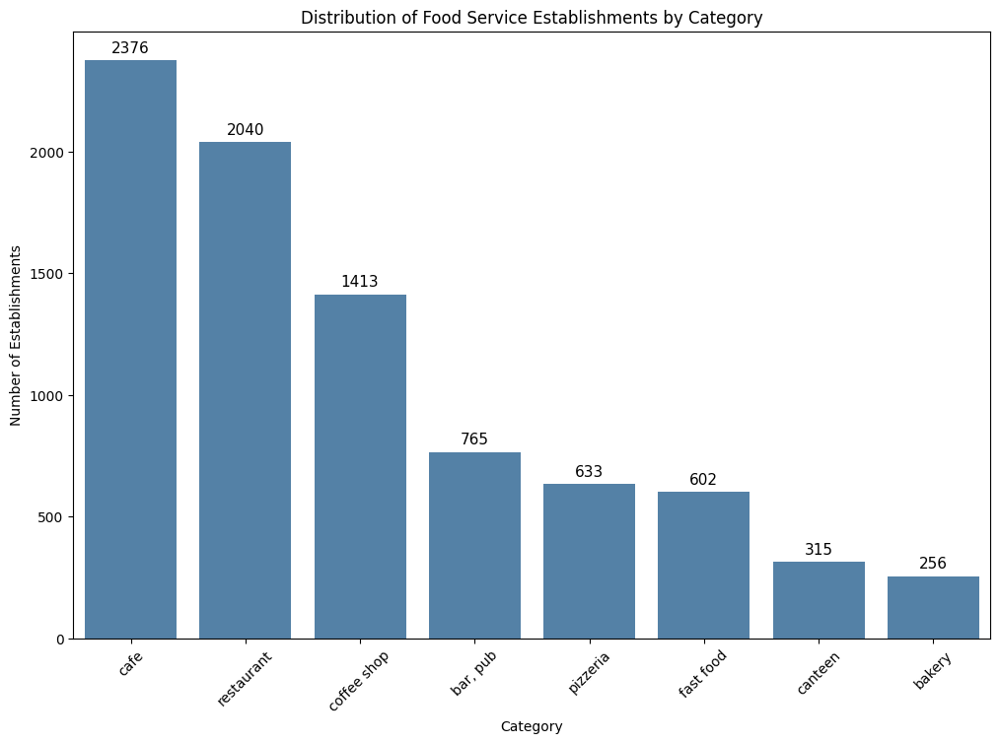

In [31]:
categories = pd.DataFrame(data['category'].value_counts()).reset_index()
categories.columns = ['category', 'count']
categories = categories.sort_values(by='count', ascending=False)

# Plotting a bar chart
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='category', y='count', data=categories, color='steelblue')

# Adding data labels on each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                xytext=(0, 9), 
                textcoords='offset points',
                fontsize=11)

# Adding labels and title
plt.title('Distribution of Food Service Establishments by Category')
plt.xlabel('Category')
plt.ylabel('Number of Establishments')
plt.xticks(rotation=45)
plt.show()

The diagram shows that cafes have the largest share in the market among all categories of food service establishments, followed by restaurants and coffee shops. The category with the smallest number of establishments is 'bakery'.

### Number of Seats

Now let's investigate the average number of seats in establishments by categories such as restaurants, cafes, pizzerias, bars, and others, and create a visualization.

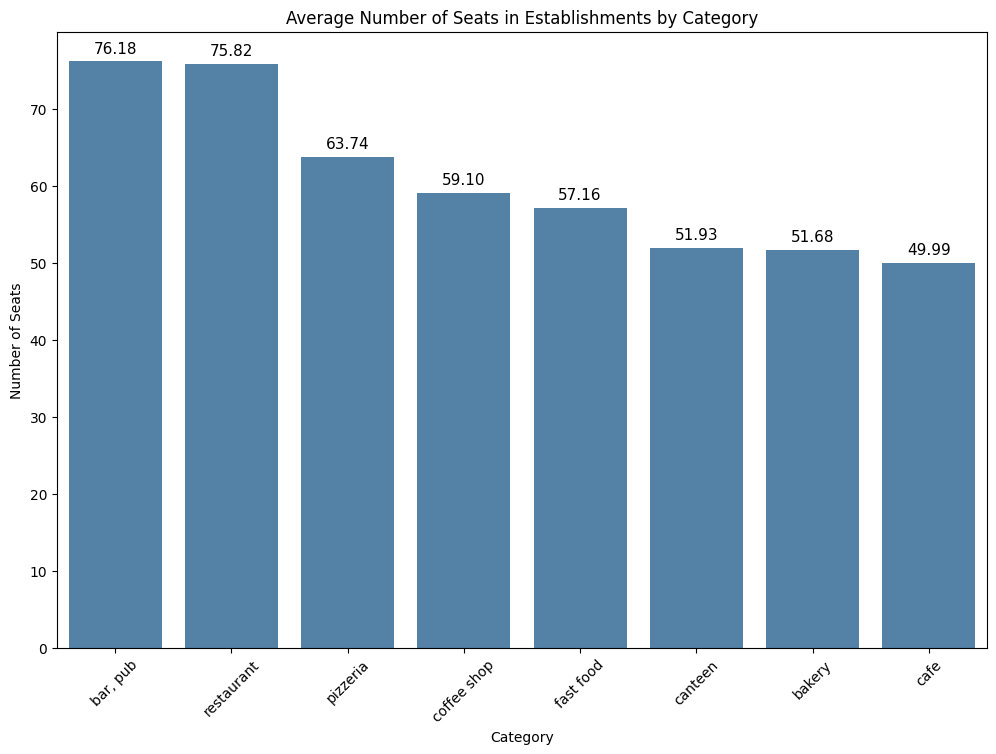

In [32]:
seats = data.groupby('category')['seats'].mean()
seats = seats.sort_values(ascending=False).reset_index()

# Plotting a bar chart
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='category', y='seats', data=seats, color='steelblue')

# Adding data labels on each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                xytext=(0, 9), 
                textcoords='offset points',
                fontsize=11)

# Adding labels and title
plt.title('Average Number of Seats in Establishments by Category')
plt.xlabel('Category')
plt.ylabel('Number of Seats')
plt.xticks(rotation=45)
plt.show()

Although cafes dominate the market share, bars/pubs and restaurants lead in seating capacity. Cafes have the fewest number of seats. The low seating capacity in cafes can be attributed to many establishments in this category being located in shared areas of shopping centers, often without dedicated seating. Additionally, during the search for implicit duplicates, it was found that some such establishments list all available seating in the shopping center as their seating capacity (for example, several small cafes or restaurants located at the same address in a shopping center might list the same number of seats, around 150). All of this creates distortions for data analysis.

### Chain and Non-Chain Establishments

Let's examine and visualize the distribution of chain and non-chain establishments in the dataset.

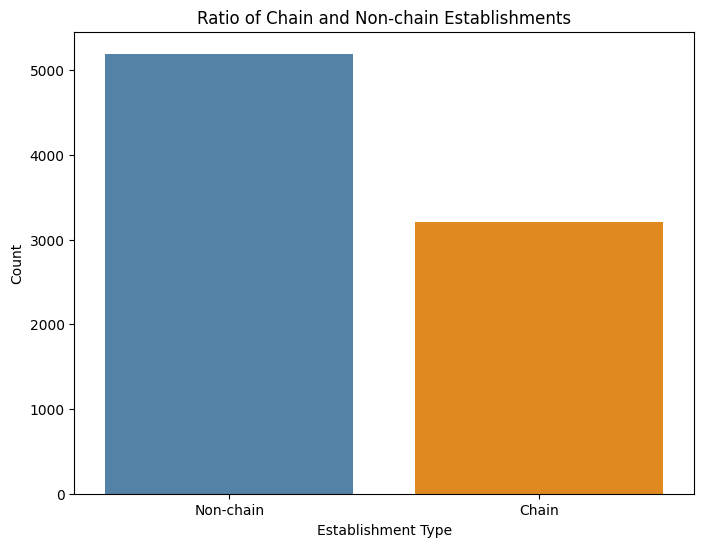

In [33]:
# Converting values 1 and 0 to textual labels
data['chain'] = data['chain'].replace({1: 'Chain', 0: 'Non-chain'})

# Plotting a seaborn countplot with specified colors
plt.figure(figsize=(8, 6))
sns.countplot(x='chain', data=data, palette=['steelblue', 'darkorange'], hue='chain')
plt.title('Ratio of Chain and Non-chain Establishments')
plt.xlabel('Establishment Type')
plt.ylabel('Count')
plt.show()

The graph shows that there are approximately one-third more non-chain establishments than chain establishments.

### Category Distribution of Chain and Non-Chain Establishments

Now let's determine which establishment categories are more likely to be chains.

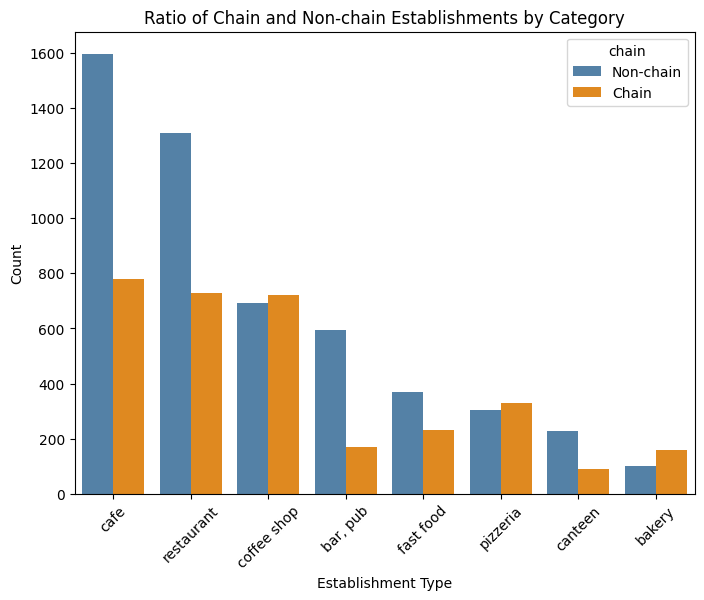

In [34]:
plt.figure(figsize=(8, 6))
sns.countplot(x='category', 
              data=data, 
              palette=['steelblue', 'darkorange'], 
              hue='chain',
              order=data[data['chain'] == 'Non-chain']['category'].value_counts().index)
plt.title('Ratio of Chain and Non-chain Establishments by Category')
plt.xlabel('Establishment Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

Cafes, restaurants, bars/pubs, fast food establishments, and cafeterias show a significant prevalence of non-chain establishments over chain ones. Conversely, coffee shops, pizzerias, and bakeries exhibit a slight dominance of chain establishments.

### Top 15 of Popular Chains

At the next stage, we will group the data by establishment names and find the top 15 popular chains in Moscow (popularity defined by the number of establishments belonging to each chain in the region). We will visualize the obtained data.

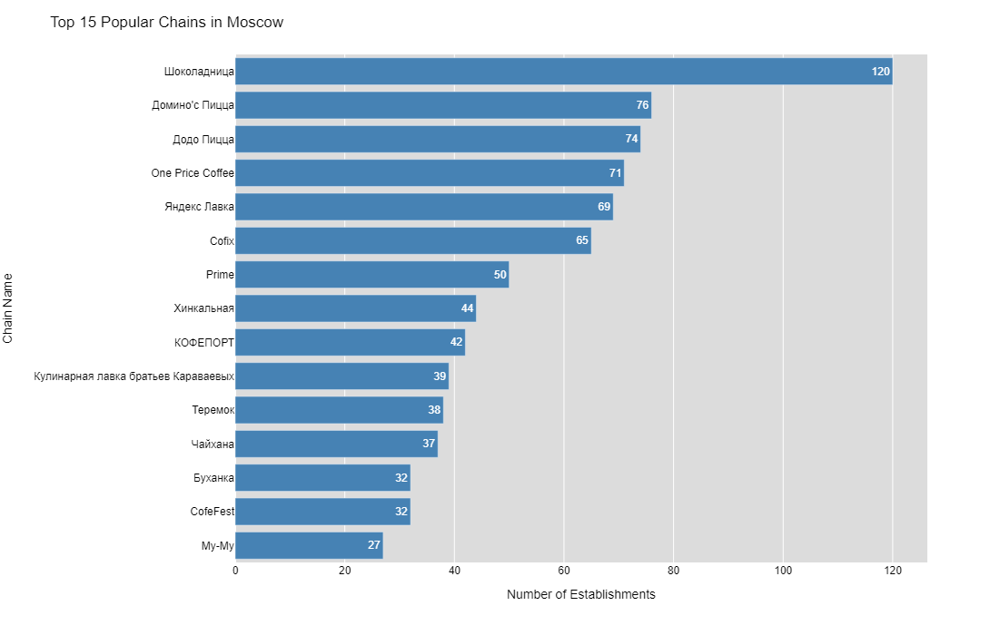

In [35]:
# Filtering the data to include only chain establishments
pop_chain_count = data[data['chain'] == 'Chain']

# Grouping by establishment names, counting the occurrences, and renaming the column
pop_chain_count = pop_chain_count.groupby('name').size().reset_index(name='total_count')

# Sorting and keeping the top fifteen
pop_chain_count = pop_chain_count.sort_values(by='total_count', ascending=False).head(15)
pop_chain_count = pop_chain_count.reset_index(drop=True)

# Plotting a bar chart
fig = px.bar(pop_chain_count.sort_values(by='total_count', ascending=True),  # load data and sort again
             x='total_count',  # specify the column for the X axis
             y='name',  # specify the column for the Y axis
             text='total_count',  # add an argument to display text information
             color_discrete_sequence=['steelblue']  # set the color of the bars
            )

# Customizing the plot
fig.update_layout(title='Top 15 Popular Chains in Moscow',
                  xaxis_title='Number of Establishments',
                  yaxis_title='Chain Name',
                  width=900,  # width of the plot
                  height=700,  # height of the plot
                  font=dict(
                      family="Arial",  # font style
                      size=12,  # font size
                      color="black"  # text color
                  ),
                  plot_bgcolor='gainsboro'
                 )

fig.show()

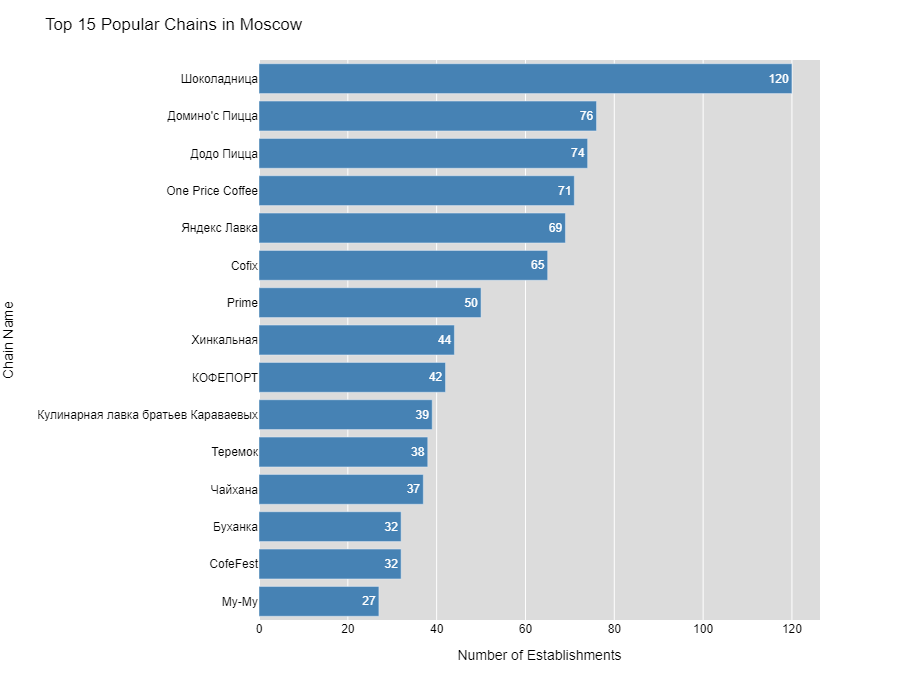

In [36]:
local_image_path = r'C:\Users\grigl\Desktop\A. Lapidus\Яндекс Практикум\Редактура проектов\Project 9\Top_15_popular_chains_in_Moscow.png'
Image(filename=local_image_path)

Let's specify which categories the top 15 restaurant chains in Moscow predominantly belong to and visualize the obtained data.

In [37]:
# Outputting data about the categories of establishments belonging to the top 15 chains in Moscow
pop_chain_count_with_category = pop_chain_count.merge(data[['name', 'category']], on='name', how='left')
pop_chain_count_with_category = pop_chain_count_with_category.drop_duplicates()
pop_chain_count_with_category

,name,total_count,category
0,Шоколадница,120,coffee shop
7,Шоколадница,120,cafe
120,Домино'с Пицца,76,pizzeria
196,Додо Пицца,74,pizzeria
270,One Price Coffee,71,coffee shop
341,Яндекс Лавка,69,restaurant
410,Cofix,65,coffee shop
475,Prime,50,restaurant
512,Prime,50,cafe
525,Хинкальная,44,fast food


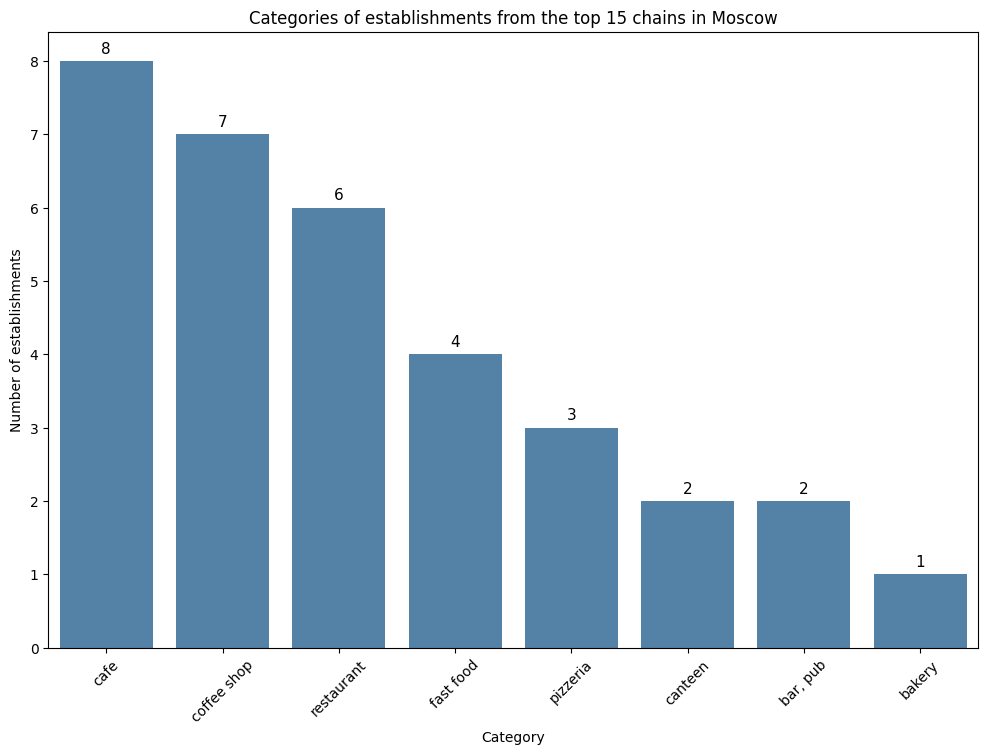

In [38]:
# Creating a DataFrame for category values and their counts
category_counts = pop_chain_count_with_category['category'].value_counts().reset_index()
category_counts.columns = ['category', 'total_count']

# Plotting a bar chart
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='category', y='total_count', data=category_counts, color='steelblue')

# Adding data labels on each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
               (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                xytext=(0, 9), 
                textcoords='offset points',
                fontsize=11)

# Adding labels and title
plt.title('Categories of establishments from the top 15 chains in Moscow')
plt.xlabel('Category')
plt.ylabel('Number of establishments')
plt.xticks(rotation=45)
plt.show()

The top 3 include widely recognized chains known to residents of Moscow and other regions of Russia. The chain establishments listed primarily belong to the categories of cafes, coffee shops, and restaurants. What unites them is the ability for visitors to eat relatively quickly, choosing from ready-made dishes or ordering food and drinks with relatively short preparation times.

### Number and Category of Establishments by Districts ('Okrugs')

Earlier, we listed 9 administrative districts of Moscow present in the dataset. Let's display the total number of establishments and the count of establishments for each category by district.

In [39]:
# Creating a pivot table with breakdown by districts and establishment categories
district_category_count = data.pivot_table(
    index='district', 
    columns='category', 
    aggfunc='size', 
    fill_value=0
).reset_index()

# Adding a column with total count of establishments per district
district_category_count['total_count'] = district_category_count.iloc[:, 1:].sum(axis=1)

# Sorting by total count in descending order
district_category_count = district_category_count.sort_values(by='total_count', ascending=False)\
                          .reset_index(drop=True)

district_category_count

category,district,bakery,"bar, pub",cafe,canteen,coffee shop,fast food,pizzeria,restaurant,total_count
0,Central Administrative Okrug,50,364,464,66,428,87,113,670,2242
1,Northern Administrative Okrug,39,68,235,41,193,58,77,187,898
2,Southern Administrative Okrug,25,68,264,44,131,85,73,202,892
3,North-Eastern Administrative Okrug,28,63,269,40,159,81,68,182,890
4,Western Administrative Okrug,37,50,239,24,150,62,71,218,851
5,Eastern Administrative Okrug,25,53,270,40,105,71,72,159,795
6,South-Eastern Administrative Okrug,13,38,282,25,89,67,55,145,714
7,South-Western Administrative Okrug,27,38,238,17,96,61,64,168,709
8,North-Western Administrative Okrug,12,23,115,18,62,30,40,109,409


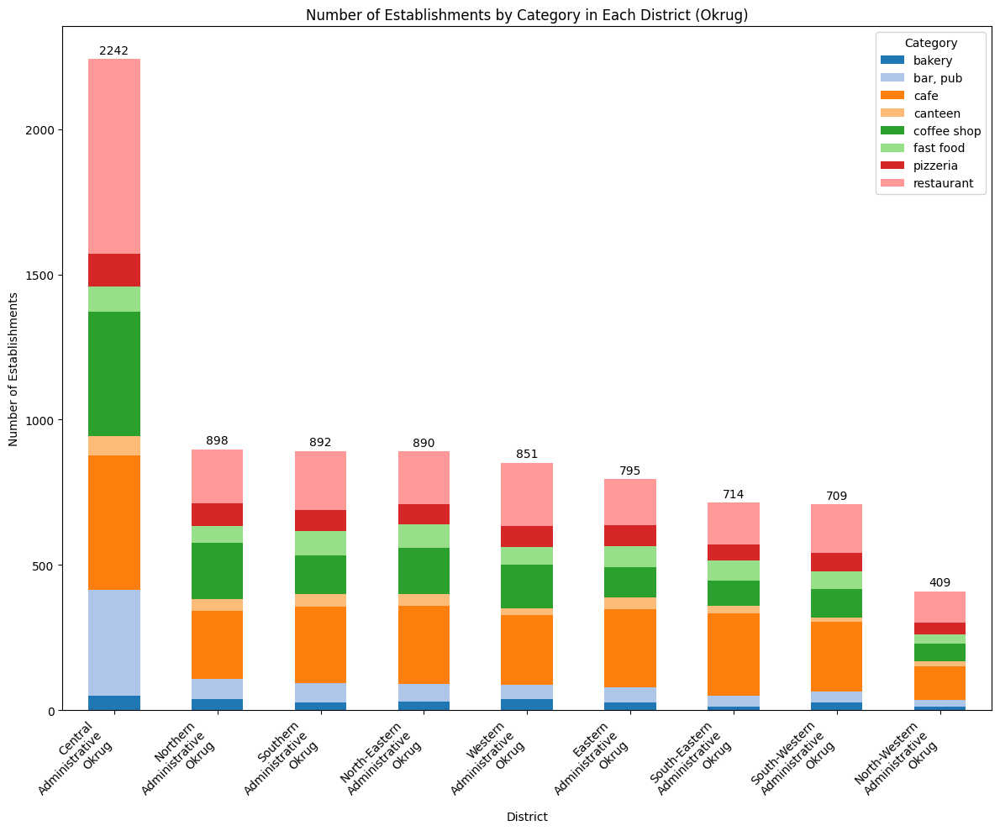

In [40]:
# Setting the figure size
plt.rcParams['figure.figsize'] = (12, 10)

# Getting colors for categories
colors = plt.cm.tab20.colors  

# Plotting a stacked bar chart
ax = district_category_count.plot(x='district', 
                                  y=list(district_category_count.columns[1:-1]), 
                                  kind='bar', 
                                  stacked=True, 
                                  color=colors)

# Adding annotations with total counts above each bar
for i, total_count in enumerate(district_category_count['total_count']):
    ax.text(i, total_count + 10, str(total_count), ha='center', va='bottom')

# Setting labels for axes and title
plt.xlabel('District')
plt.ylabel('Number of Establishments')
plt.title('Number of Establishments by Category in Each District (Okrug)')

# Adding legend with title
plt.legend(title='Category', bbox_to_anchor=(1, 1))

# Splitting x-axis labels into two lines for better readability
ax.set_xticklabels([label.replace(' ', '\n') for label in district_category_count['district']], 
                   rotation=45, ha='right')

# Improving layout of elements on the plot
plt.tight_layout()

# Showing the plot
plt.show()

From the chart, it's evident that the Central Administrative District is the absolute leader in the number of establishments across all categories. It's also noteworthy that in the Central District restaurants are the predominant type of establishment, whereas cafes dominate in other districts.

### Distribution of Average Ratings by Establishment Categories

Visualizing the distribution of average ratings by establishment categories.

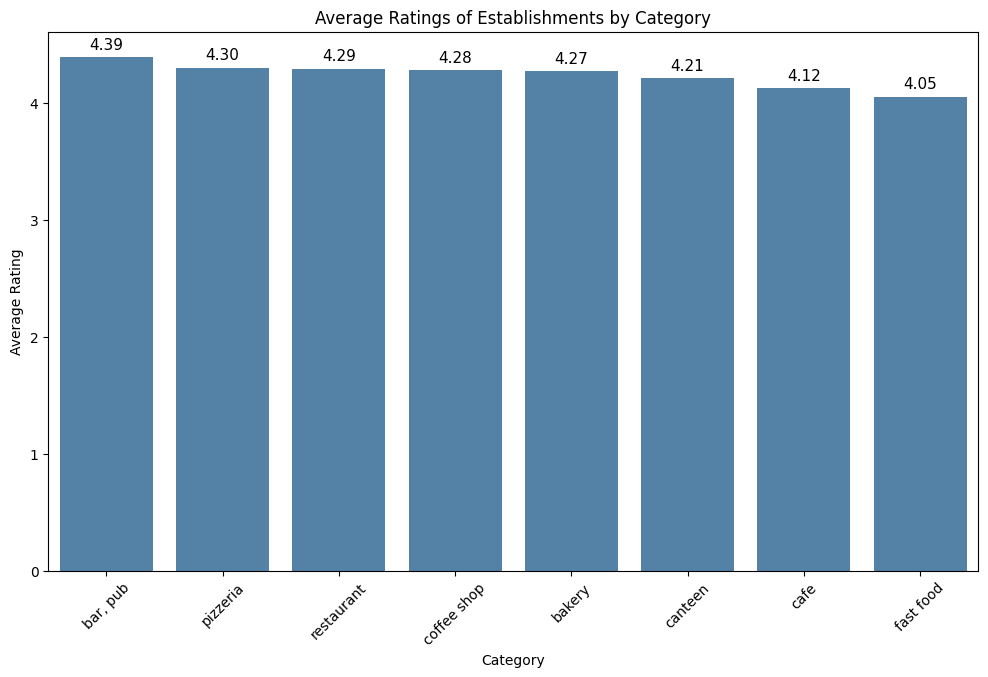

In [41]:
rating_pivot = data.pivot_table(index='category', values='rating', aggfunc='mean')
rating_pivot = rating_pivot.sort_values(by='rating', ascending=False)
rating_pivot = rating_pivot.reset_index()

# Building a bar plot
plt.figure(figsize=(12, 7))
ax = sns.barplot(x='category', y='rating', data=rating_pivot, color='steelblue')

# Adding data labels on each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                xytext=(0, 9), 
                textcoords='offset points',
                fontsize=11)

# Adding titles and labels
plt.title('Average Ratings of Establishments by Category')
plt.xlabel('Category')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.show()

Bars and pubs have the highest average rating, while fast food establishments have the lowest. However, it's worth noting that the difference between the highest and lowest average ratings is less than half a point on a 5-point scale.

### Choropleth Map of the Distribution of Average Ratings of Establishments by Districts

Let's create a choropleth map displaying the average ratings of establishments for each district.

The boundaries of Moscow districts found in the dataset are stored in the file `admin_level_geomap.geojson`.

In [42]:
# Calculating the average rating for establishments in each district
rating_by_district = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_by_district = rating_by_district.sort_values(by='rating')
rating_by_district.reset_index(drop=True)

,district,rating
0,South-Eastern Administrative Okrug,4.101120
1,North-Eastern Administrative Okrug,4.148764
2,South-Western Administrative Okrug,4.172920
3,Eastern Administrative Okrug,4.174591
4,Western Administrative Okrug,4.181551
5,Southern Administrative Okrug,4.184417
6,North-Western Administrative Okrug,4.208802
7,Northern Administrative Okrug,4.239644
8,Central Administrative Okrug,4.377520


In [43]:
# Reading JSON file with paths
with open('config.json', 'r', encoding='utf-8') as f:
    config = json.load(f)

# Loading GeoJSON file with Moscow district boundaries
state_geo_path = config['moscow_map']

# Checking and loading GeoJSON data
with open(state_geo_path, 'r', encoding='utf-8') as f:
    state_geo = geojson.load(f)

# Coordinates of Moscow center
moscow_lat, moscow_lng = 55.751244, 37.618423

# Creating a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Creating a choropleth map using the Choropleth constructor and adding it to the map
Choropleth(
    geo_data=state_geo,
    data=rating_by_district,
    columns=['district', 'rating'],
    key_on='properties.name:en',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Average Ratings of Establishments by Districts',
    opacity=0.5  
).add_to(m)

# Adding district names as tooltips
tooltip = GeoJsonTooltip(
    fields=['name:en'],  
    aliases=['District'],  
    localize=True,  
    sticky=False,  
    labels=True,  
    style="color: black; background-color: rgba(255, 255, 255, 0.8);"  
)

geojson_layer = GeoJson(
    state_geo,
    tooltip=tooltip,
    style_function=lambda feature: {
        'fillColor': 'black',  
        'color': 'black',  
        'weight': 1, 
        'dashArray': '3',  
        'fillOpacity': 0,  
    }
).add_to(m)

# Displaying the map
#m

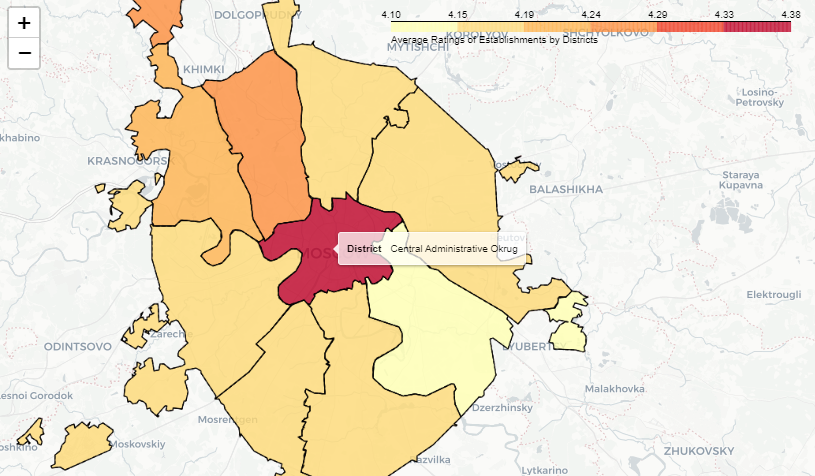

In [44]:
local_image_path_2 = r'C:\Users\grigl\Desktop\A. Lapidus\Яндекс Практикум\Редактура проектов\Project 9\3.8. Choropleth Map.png'
Image(filename=local_image_path_2)

In the Central Administrative District, not only are the majority of all establishments located, but they also boast the highest ratings. Following in terms of high ratings are the Northern and North-Western Administrative Districts.

### Choropleth Map of All the Establishments

Let's display all establishments from the dataset on a map using clustering with the folium library.

In [45]:
# moscow_lat - latitude of Moscow center, moscow_lng - longitude of Moscow center
moscow_lat, moscow_lng = 55.751244, 37.618423

# Creating a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Creating an empty cluster and adding it to the map
marker_cluster = MarkerCluster().add_to(m)

# Defining a function that takes a row from the dataframe,
# creates a marker at the current point, and adds it to the marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# Adding district names as tooltips
tooltip = GeoJsonTooltip(
    fields=['name:en'],  
    aliases=['District'],  
    localize=True,  
    sticky=False,  
    labels=True,  
    style="color: black; background-color: rgba(255, 255, 255, 0.8);"  
)

geojson_layer = GeoJson(
    state_geo,
    tooltip=tooltip,
    style_function=lambda feature: {
        'fillColor': 'black',  
        'color': 'black',  
        'weight': 1, 
        'dashArray': '3',  
        'fillOpacity': 0,  
    }
).add_to(m)

# Applying the create_clusters() function to each row of the dataframe
data.apply(create_clusters, axis=1)

# Displaying the map
#m

0       None
1       None
2       None
3       None
4       None
5       None
6       None
7       None
8       None
9       None
10      None
11      None
12      None
13      None
14      None
15      None
16      None
17      None
18      None
19      None
20      None
21      None
22      None
23      None
24      None
25      None
26      None
27      None
28      None
29      None
30      None
31      None
32      None
33      None
34      None
35      None
36      None
37      None
38      None
39      None
40      None
41      None
42      None
43      None
44      None
45      None
46      None
47      None
48      None
49      None
50      None
51      None
52      None
53      None
54      None
55      None
56      None
57      None
58      None
59      None
60      None
61      None
62      None
63      None
64      None
65      None
66      None
67      None
68      None
69      None
70      None
71      None
72      None
73      None
74      None
75      None
76      None

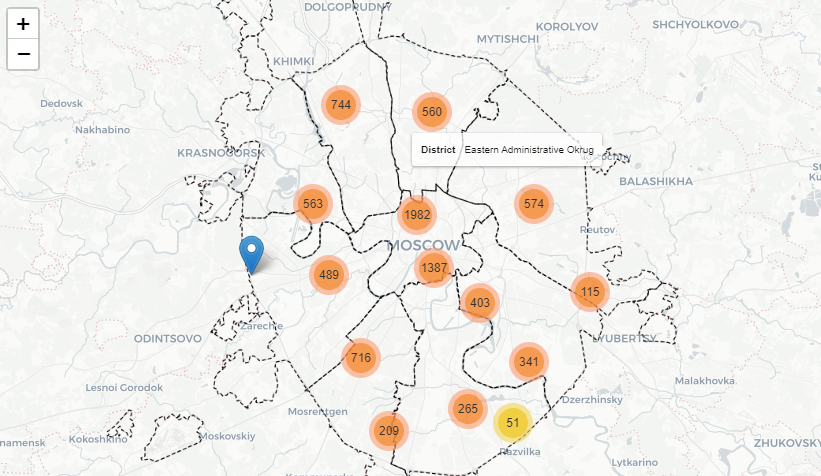

In [46]:
local_image_path_3 = r'C:\Users\grigl\Desktop\A. Lapidus\Яндекс Практикум\Редактура проектов\Project 9\3.9. Choropleth Map.png'
Image(filename=local_image_path_3)

The map with clustered markers confirms our earlier findings: the highest concentration of establishments is indeed in the Central Administrative District.

### Top 15 Streets by the Number of Establishments

Let's find the top 15 streets by the number of establishments and plot a graph showing the distribution of establishments and their categories by these streets.

In [47]:
# Grouping by street names, counting the number of listings, and renaming the column
streets_count = data.groupby('street').size().reset_index(name='total_count')

# Sorting and keeping the top 15
streets_count = streets_count.sort_values(by='total_count', ascending=False).head(15)
streets_count = streets_count.reset_index(drop=True)

# Merging with establishment categories
streets_count_with_category = streets_count.merge(data[['street', 'category']], on='street', how='left')

# Creating a pivot table with breakdown by establishment categories
streets_category_count = streets_count_with_category.pivot_table(
    index='street', 
    columns='category', 
    values='total_count', 
    aggfunc='size', 
    fill_value=0
).reset_index()

# Ensuring all columns except 'street' are numeric
numerical_columns = streets_category_count.columns.drop('street')
streets_category_count[numerical_columns] = streets_category_count[numerical_columns].apply(pd.to_numeric)

# Adding a column with the total number of establishments per street
streets_category_count['total_count'] = streets_category_count[numerical_columns].sum(axis=1)

# Sorting the table by total count of establishments
streets_category_count = streets_category_count.sort_values(by='total_count', ascending=False).reset_index(drop=True)

streets_category_count

category,street,bakery,"bar, pub",cafe,canteen,coffee shop,fast food,pizzeria,restaurant,total_count
0,проспект Мира,4,12,53,2,36,21,11,45,184
1,Профсоюзная улица,4,6,35,3,18,15,15,26,122
2,проспект Вернадского,1,7,25,2,16,12,12,33,108
3,Ленинский проспект,3,10,26,5,23,2,5,33,107
4,Ленинградский проспект,4,15,12,3,25,2,9,25,95
5,Дмитровское шоссе,2,6,23,4,11,10,8,24,88
6,Каширское шоссе,0,2,20,5,16,10,5,19,77
7,Варшавское шоссе,0,6,18,7,14,7,4,20,76
8,Ленинградское шоссе,2,5,13,3,13,5,3,26,70
9,МКАД,0,1,45,1,4,9,0,5,65


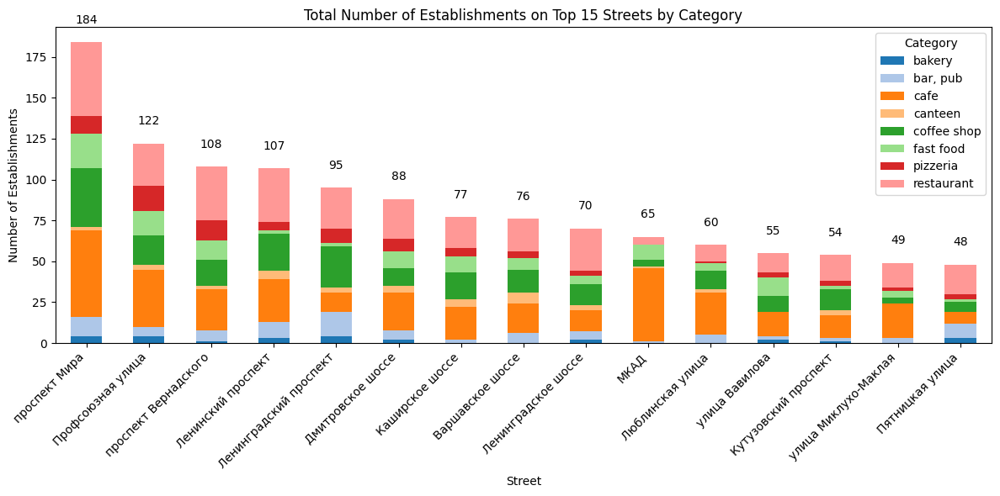

In [48]:
# Plotting a bar chart
plt.rcParams['figure.figsize'] = (12, 6)
colors = plt.cm.tab20.colors  
streets_category_count.plot(x='street', 
                            y=list(streets_category_count.columns[1:-1]), 
                            kind='bar', 
                            stacked=True, 
                            color=colors)

# Adding annotations with total counts above each bar
for i, total_count in enumerate(streets_category_count['total_count']):
    plt.text(i, total_count + 10, str(total_count), ha='center', va='bottom')

plt.xlabel('Street')
plt.ylabel('Number of Establishments')
plt.title('Total Number of Establishments on Top 15 Streets by Category')
plt.legend(title='Category', bbox_to_anchor=(1, 1))
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Leading by a considerable margin in total number of establishments is Prospekt Mira, followed by Profsoyuznaya Street, Prospekt Vernadskogo, and Leninsky Prospekt. Notably, the MKAD (Moscow Ring Road) stands out with 'cafe' establishments comprising a vast majority compared to all other categories of establishments.

### Streets with One Establishment

Identifying streets where only one foodservice establishment is located.

In [49]:
# Finding streets where only one foodservice establishment is located
streets_count = data.groupby('street').size().reset_index(name='total_count')
one_place_streets = streets_count.query('total_count == 1')['street']

# Filtering the data and displaying rows from the original dataframe for the found streets
one_place_streets_filtered_data = data.query('street in @one_place_streets')

one_place_streets_filtered_data_st = f'''
<div style="max-height:200px; overflow:auto;">
    {one_place_streets_filtered_data.to_html(index=True)}
</div>
'''

display(HTML(one_place_streets_filtered_data_st))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,middle_beer_glass,street,is_24_7
15,Дом обеда,canteen,"Москва, улица Бусиновская Горка, 2",Northern Administrative Okrug,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,average,Average bill:300–500 ₽,400.0,NaN,Non-chain,180,NaN,улица Бусиновская Горка,False
21,7/12,cafe,"Москва, Прибрежный проезд, 7",Northern Administrative Okrug,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,Non-chain,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,coffee shop,"Москва, парк Левобережный",Northern Administrative Okrug,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,Chain,0,NaN,парк Левобережный,False
58,Coffeekaldi's,coffee shop,"Москва, Угличская улица, 13, стр. 8",North-Eastern Administrative Okrug,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,average,Average bill:500–800 ₽,650.0,NaN,Chain,0,NaN,Угличская улица,False
60,Чебуречная история,coffee shop,"Москва, ландшафтный заказник Лианозовский",North-Eastern Administrative Okrug,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,Chain,0,NaN,ландшафтный заказник Лианозовский,False
64,Testo мания,coffee shop,"Москва, Лианозовский парк культуры и отдыха",North-Eastern Administrative Okrug,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,Non-chain,0,NaN,Лианозовский парк культуры и отдыха,False
71,CofeFest,coffee shop,"Москва, Новгородская улица, 23А",North-Eastern Administrative Okrug,пн-пт 08:00–19:00,55.901799,37.577672,4.1,NaN,NaN,NaN,NaN,Chain,0,NaN,Новгородская улица,False
73,Веранда,restaurant,"Москва, парк Алтуфьево",North-Eastern Administrative Okrug,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,NaN,NaN,NaN,NaN,Chain,0,NaN,парк Алтуфьево,False
97,Жигулевское,"bar, pub","Москва, Бибиревская улица, 7к2",North-Eastern Administrative Okrug,"пн-чт 14:00–00:00; пт,сб 14:00–02:00; вс 14:00–00:00",55.879733,37.593734,4.5,average,Price of a beer glass:90–230 ₽,NaN,NaN,Non-chain,0,160.0,Бибиревская улица,False
103,Тетри,fast food,"Москва, Лианозовский проезд, вл1",North-Eastern Administrative Okrug,вт-вс 09:00–19:00,55.896922,37.554929,4.0,average,Average bill:150–250 ₽,200.0,NaN,Non-chain,0,NaN,Лианозовский проезд,False


Let's map the establishments that are the only ones on their respective streets.

In [50]:
# moscow_lat - latitude of Moscow center, moscow_lng - longitude of Moscow center
moscow_lat, moscow_lng = 55.751244, 37.618423

# Creating a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Creating an empty marker cluster and adding it to the map
marker_cluster = MarkerCluster().add_to(m)

# Defining a function that takes a DataFrame row,
# creates a marker at the current point, and adds it to the marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']} {row['rating']}",
    ).add_to(marker_cluster)

# Applying the create_clusters() function to each row of the DataFrame
one_place_streets_filtered_data.apply(create_clusters, axis=1)

# Showing the map
#m

15      None
21      None
25      None
58      None
60      None
64      None
71      None
73      None
97      None
103     None
111     None
116     None
157     None
177     None
189     None
192     None
199     None
207     None
243     None
248     None
267     None
270     None
282     None
309     None
324     None
341     None
400     None
434     None
466     None
480     None
484     None
553     None
577     None
614     None
622     None
655     None
723     None
750     None
757     None
769     None
776     None
790     None
808     None
818     None
828     None
833     None
856     None
889     None
893     None
895     None
959     None
1094    None
1105    None
1121    None
1123    None
1152    None
1176    None
1199    None
1273    None
1278    None
1282    None
1288    None
1307    None
1331    None
1364    None
1368    None
1374    None
1417    None
1422    None
1436    None
1441    None
1455    None
1503    None
1512    None
1520    None
1567    None
1568    None

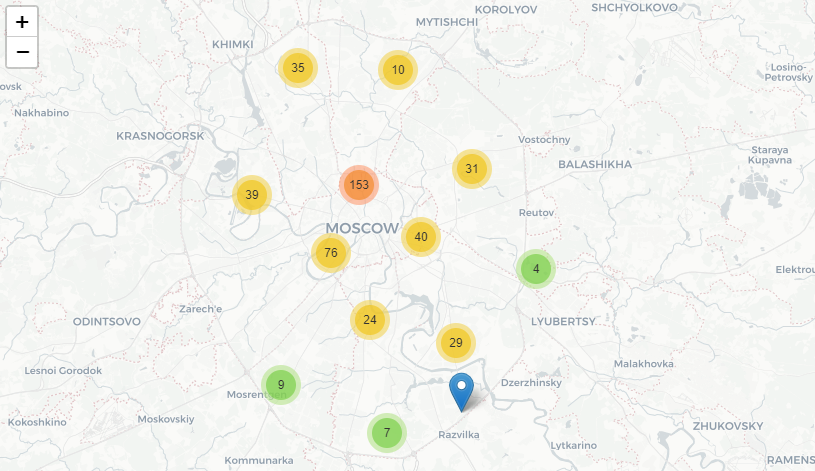

In [51]:
local_image_path_4 = r'C:\Users\grigl\Desktop\A. Lapidus\Яндекс Практикум\Редактура проектов\Project 9\Streets with One Establishment.png'
Image(filename=local_image_path_4)

On streets with only one establishment, you can find places belonging to all categories. What unites these establishments is their location—either they are situated on the outskirts where there are relatively few establishments, or, when located in the central part of the city, they are found in alleys or small streets.

### Choropleth Map of Average Check Values by Districts

Values of average checks for establishments are stored in the column `middle_avg_bill`. These numbers represent the approximate cost of an order in rubles, which is often expressed as a range. We will calculate the median of this column for each district and use this value as a price indicator for the district. Then, we will create a choropleth map with the obtained values for each district.

In [52]:
# Calculating the median value of the average check for establishments in each district:
bill_by_district = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
bill_by_district = bill_by_district.sort_values(by='middle_avg_bill')
bill_by_district = bill_by_district.reset_index(drop=True)

In [53]:
# moscow_lat - latitude of the center of Moscow, moscow_lng - longitude of the center of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423

# Creating a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Creating a choropleth map and add it to the map
Choropleth(
    geo_data=state_geo,
    data=bill_by_district,
    columns=['district', 'middle_avg_bill'],
    key_on='properties.name:en',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Average Bill by District',
    opacity=0.5  
).add_to(m)

# Adding district names as tooltips
tooltip = GeoJsonTooltip(
    fields=['name:en'],
    aliases=['District'],
    localize=True,
    sticky=False,
    labels=True,
    style="color: black; background-color: rgba(255, 255, 255, 0.8);"
)

geojson_layer = GeoJson(
    state_geo,
    tooltip=tooltip,
    style_function=lambda feature: {
        'fillColor': 'black',
        'color': 'black',
        'weight': 1,
        'dashArray': '3',
        'fillOpacity': 0,
    }
).add_to(m)

# Display the map
#m

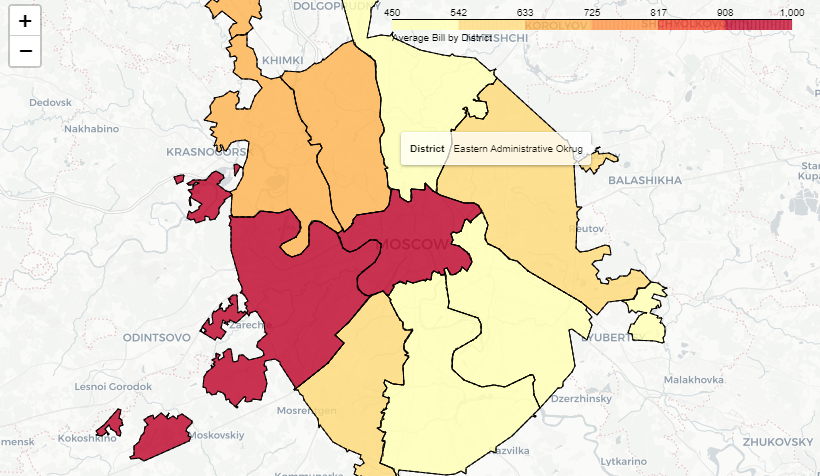

In [54]:
local_image_path_5 = r'C:\Users\grigl\Desktop\A. Lapidus\Яндекс Практикум\Редактура проектов\Project 9\3.12. Choropleth Map of Average Check Values.png'
Image(filename=local_image_path_5)

According to the map and absolute data, the leaders in the average bill size are the Central and Western Administrative Districts. The difference between the median average bill in the Central Administrative District and the districts with the lowest prices (North-Eastern, South-Eastern, and Southern) is more than 200%. 

### Choropleth Map of Average Price for a Cappuccino Cup by Districts

Conducting a similar study based on the average price of a cup of cappuccino.

In [55]:
# Calculate the median value of a cup of cappuccino in establishments located in each district:
coffee_by_district = data.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
coffee_by_district = coffee_by_district.sort_values(by = 'middle_coffee_cup')
coffee_by_district.reset_index(drop = True)

,district,middle_coffee_cup
0,Eastern Administrative Okrug,135.0
1,South-Eastern Administrative Okrug,145.0
2,Southern Administrative Okrug,149.5
3,North-Western Administrative Okrug,150.0
4,Northern Administrative Okrug,159.0
5,North-Eastern Administrative Okrug,162.5
6,Western Administrative Okrug,187.0
7,Central Administrative Okrug,190.0
8,South-Western Administrative Okrug,197.0


In [56]:
# moscow_lat - latitude of the center of Moscow, moscow_lng - longitude of the center of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423

# Creating a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Creating a choropleth map using the Choropleth constructor and adding it to the map
Choropleth(
    geo_data=state_geo,
    data=coffee_by_district,
    columns=['district', 'middle_coffee_cup'],
    key_on='properties.name:en',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Median Price of a Cup of Cappuccino by District',
    opacity=0.5  
).add_to(m)

# Adding district names as tooltips
tooltip = GeoJsonTooltip(
    fields=['name:en'],  
    aliases=['District'],  
    localize=True,  
    sticky=False,  
    labels=True,  
    style="color: black; background-color: rgba(255, 255, 255, 0.8);"  
)

geojson_layer = GeoJson(
    state_geo,
    tooltip=tooltip,
    style_function=lambda feature: {
        'fillColor': 'black',  
        'color': 'black',  
        'weight': 1, 
        'dashArray': '3',  
        'fillOpacity': 0,  
    }
).add_to(m)

# Displaying the map
#m

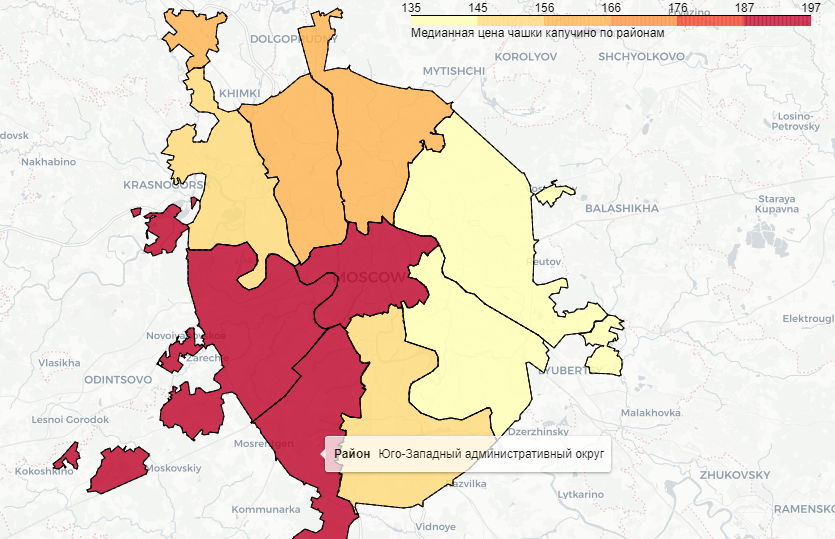

In [57]:
local_image_path_6 = r'C:\Users\grigl\Desktop\A. Lapidus\Яндекс Практикум\Редактура проектов\Project 9\3.13. Choropleth Map of Average Price for a Cappuccino.png'
Image(filename=local_image_path_6)

Unlike the average bill across establishments, when evaluating the median price of a cup of cappuccino, three districts emerge as leaders - in addition to the Central and Western Districts, the South-Western Administrative District also joins. However, it is worth noting that the median price variation for cappuccino is significantly less than the variation in food prices - the price variation between the highest and lowest average bills was more than 2 times, while here the difference is only about 45%, making the market significantly more competitive.

### Choropleth Map of Average Price for a Beer Glass by Districts

Conducting a similar study based on the average price of a beer glass.

In [58]:
# Calculate the median value of a beer glass in establishments located in each district:
beer_by_district = data.groupby('district', as_index=False)['middle_beer_glass'].agg('median')
beer_by_district = beer_by_district.sort_values(by = 'middle_beer_glass')
beer_by_district.reset_index(drop = True)

,district,middle_beer_glass
0,Northern Administrative Okrug,250.0
1,Eastern Administrative Okrug,260.0
2,Southern Administrative Okrug,265.0
3,South-Western Administrative Okrug,275.0
4,North-Western Administrative Okrug,277.5
5,Western Administrative Okrug,297.5
6,North-Eastern Administrative Okrug,300.0
7,South-Eastern Administrative Okrug,300.0
8,Central Administrative Okrug,335.0


In [59]:
# moscow_lat - latitude of the center of Moscow, moscow_lng - longitude of the center of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423

# Creating a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Creating a choropleth map with the Choropleth constructor and adding it to the map
Choropleth(
    geo_data=state_geo,
    data=beer_by_district,
    columns=['district', 'middle_beer_glass'],
    key_on='properties.name:en',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Median Price of a Glass of Beer by District',
    opacity=0.5  
).add_to(m)

# Adding district names as tooltips
tooltip = GeoJsonTooltip(
    fields=['name:en'],  
    aliases=['District'],  
    localize=True,  
    sticky=False,  
    labels=True,  
    style="color: black; background-color: rgba(255, 255, 255, 0.8);"  
)

geojson_layer = GeoJson(
    state_geo,
    tooltip=tooltip,
    style_function=lambda feature: {
        'fillColor': 'black',  
        'color': 'black',  
        'weight': 1, 
        'dashArray': '3',  
        'fillOpacity': 0,  
    }
).add_to(m)
# Displaying the map
#m

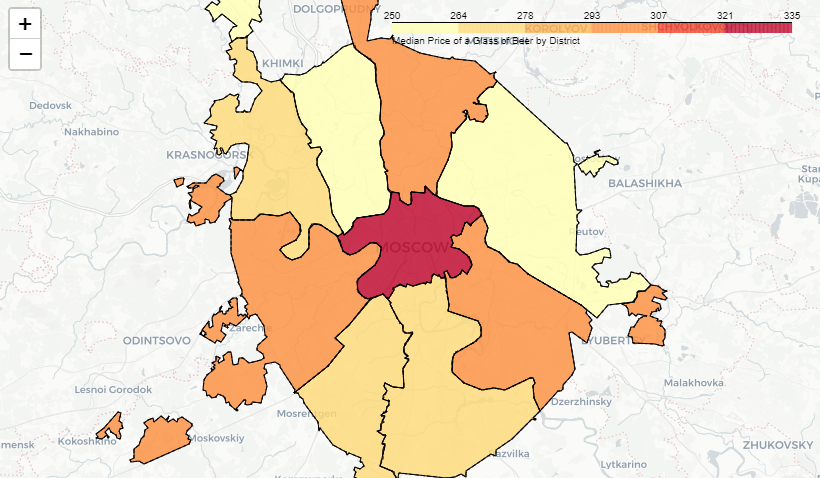

In [60]:
local_image_path_7 = r'C:\Users\grigl\Desktop\A. Lapidus\Яндекс Практикум\Редактура проектов\Project 9\3.14. Choropleth Map of Average Price for a Beer.png'
Image(filename=local_image_path_7)

The Central District again leads in the median price of a glass of beer. However, the districts that follow are distributed differently than the distribution for food and coffee prices — Western, North-Eastern, and South-Eastern Districts share the second place.

In general, it can be said that cafes and restaurants are the leaders in terms of the number of establishments in Moscow, while cafeterias and bakeries are the least common. Bars/pubs and restaurants have the highest average number of seats, while cafes have the fewest. The number of establishments in a specific category has little effect on their average rating, which fluctuates by less than 0.5 points on a 5-point scale depending on the category.

Non-chain establishments outnumber chain ones by about a third. Non-chain venues are more often cafes, restaurants, bars/pubs, fast food places, and cafeterias. Chain venues are more commonly bakeries, pizzerias, and coffee shops, although the share of chain and non-chain places is nearly equal for the latter two categories.

Among the most popular chains, those present both in Moscow and other regions are the leaders. The top three chains are 'Shokoladnitsa' (with a significant lead), 'Domino's Pizza,' and 'Dodo Pizza.'

The Central District is the clear leader in the number of establishments across all categories. It also leads in average rating, number of establishments, average check, as well as the median price of coffee and beer.

The largest number of establishments is found on the major streets, with four out of the top five positions occupied by avenues — Prospekt Mira, Prospekt Vernadskogo, Leninsky Prospekt, and Leningradskiy Prospekt — and only one by Profsoyuznaya Street.

The fewest establishments are located in the city center in alleys and small streets or on the periphery.

## Detailed Study: Opening a Coffee Shop

The client who commissioned the study has an idea to open a popular and affordable coffee shop in Moscow. The client is not afraid of competition in this sector, despite the existing number of coffee shops in large cities. We will try to determine how relevant the client's idea is.

### Number of Coffee Shops

In [61]:
# Determining the number of coffee shops within a dataFrame
len(data.loc[data['category'] == 'coffee shop'])

1413

Out of 8,400 rows with information about dining establishments, 1,413 contain information about coffee shops. Thus, the proportion of coffee shops is about 17%.

### Characteristics of Coffee Shop Locations

Let’s determine in which districts there are the most coffee shops and what the characteristics of their locations are.

In [62]:
# Filtering the coffee shops from the dataFrame
coffee_shop = data.loc[data['category'] == 'coffee shop']

coffee_shop_by_district = coffee_shop.groupby('district', as_index=False)['name'].agg('count')
coffee_shop_by_district = coffee_shop_by_district.sort_values(by = 'name')
coffee_shop_by_district = coffee_shop_by_district.reset_index(drop = True)
coffee_shop_by_district

,district,name
0,North-Western Administrative Okrug,62
1,South-Eastern Administrative Okrug,89
2,South-Western Administrative Okrug,96
3,Eastern Administrative Okrug,105
4,Southern Administrative Okrug,131
5,Western Administrative Okrug,150
6,North-Eastern Administrative Okrug,159
7,Northern Administrative Okrug,193
8,Central Administrative Okrug,428


In [63]:
coffee_shop_by_district['name'].sum()

1413

In [64]:
# Displaying all coffee shops on the map using clusters with the folium library
# moscow_lat - latitude of the center of Moscow, moscow_lng - longitude of the center of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423

# Creating a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Creating an empty cluster and adding it to the map
marker_cluster = MarkerCluster().add_to(m)

# Defining a function that takes a row from the dataframe,
# creates a marker at the current point, and adds it to the marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# Applying the create_clusters() function to each row of the dataframe
coffee_shop.apply(create_clusters, axis=1)

# Creating a choropleth map with the Choropleth constructor and adding it to the map
Choropleth(
    geo_data=state_geo,
    data=coffee_shop_by_district,
    columns=['district', 'name'],
    key_on='properties.name:en',
    fill_color='YlOrRd',
    fill_opacity=0.5,
    legend_name='Number of Coffee Shops by District',
    opacity=0.5  
).add_to(m)

# Adding district names as tooltips
tooltip = GeoJsonTooltip(
    fields=['name:en'],  
    aliases=['District'],  
    localize=True,  
    sticky=False,  
    labels=True,  
    style="color: black; background-color: rgba(255, 255, 255, 0.8);"  
)

geojson_layer = GeoJson(
    state_geo,
    tooltip=tooltip,
    style_function=lambda feature: {
        'fillColor': 'black',  
        'color': 'black',  
        'weight': 1, 
        'dashArray': '3',  
        'fillOpacity': 0,  
    }
).add_to(m)

# Displaying the map
#m

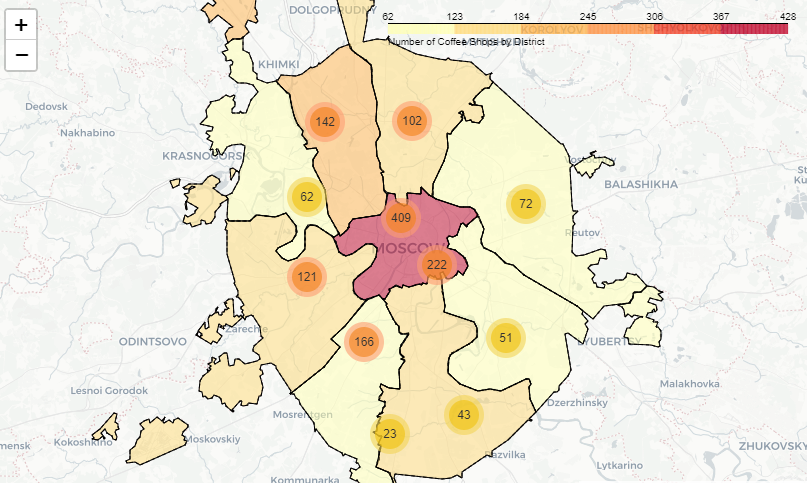

In [65]:
local_image_path_8 = r'C:\Users\grigl\Desktop\A. Lapidus\Яндекс Практикум\Редактура проектов\Project 9\4.2. Characteristics of Coffee Shop Locations.png'
Image(filename=local_image_path_8)

There are the most coffee shops in the Central District, similar to other types of establishments. The density of coffee shops in this district is nearly twice as high as in the next densest district, the Northern Administrative District. Regarding the locations of coffee shops, it is evident from the map that this type of establishment frequently appears at intersections of two or more streets. This makes sense because visitors often want to grab coffee at a location that is convenient for them. Unlike restaurants, which attract traffic, coffee shops are typically located in more accessible, high-traffic areas.

### 24/7 Coffee Shops

Let's check if there are any 24/7 coffee shops and determine what percentage they make up.

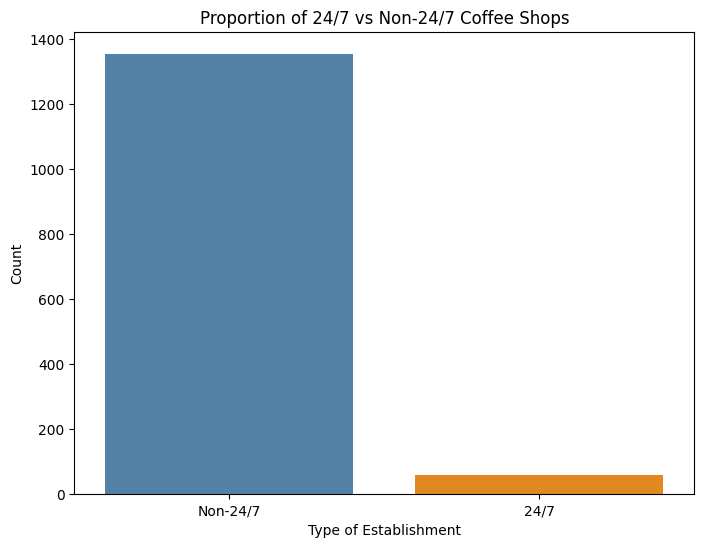

In [66]:
# Converting True and False values to text labels
coffee_shop_copy = coffee_shop.copy()
coffee_shop_copy['is_24_7'] = coffee_shop_copy['is_24_7'].replace({True: '24/7', False: 'Non-24/7'})

# Plotting a bar chart using seaborn
plt.figure(figsize=(8, 6))
sns.countplot(x='is_24_7', data=coffee_shop_copy, hue='is_24_7', palette=['steelblue', 'darkorange'], legend=False)
plt.title('Proportion of 24/7 vs Non-24/7 Coffee Shops')
plt.xlabel('Type of Establishment')
plt.ylabel('Count')
plt.show()

Marking the 24/7 establishments on the map.

In [67]:
coffee_shop_24_7 = coffee_shop.loc[coffee_shop['is_24_7'] == True]

# moscow_lat - latitude of the center of Moscow, moscow_lng - longitude of the center of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423

# Creating a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Creating an empty cluster and adding it to the map
marker_cluster = MarkerCluster().add_to(m)

# Defining a function that takes a dataframe row,
# creates a marker at the current point, and adds it to the marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# Applying the create_clusters() function to each row of the dataframe
coffee_shop_24_7.apply(create_clusters, axis=1)

# Adding district names as tooltips
tooltip = GeoJsonTooltip(
    fields=['name:en'],  
    aliases=['District'],  
    localize=True,  
    sticky=False,  
    labels=True,  
    style="color: black; background-color: rgba(255, 255, 255, 0.8);"  
)

geojson_layer = GeoJson(
    state_geo,
    tooltip=tooltip,
    style_function=lambda feature: {
        'fillColor': 'black',  
        'color': 'black',  
        'weight': 1, 
        'dashArray': '3',  
        'fillOpacity': 0,  
    }
).add_to(m)

# Displaying the map
#m

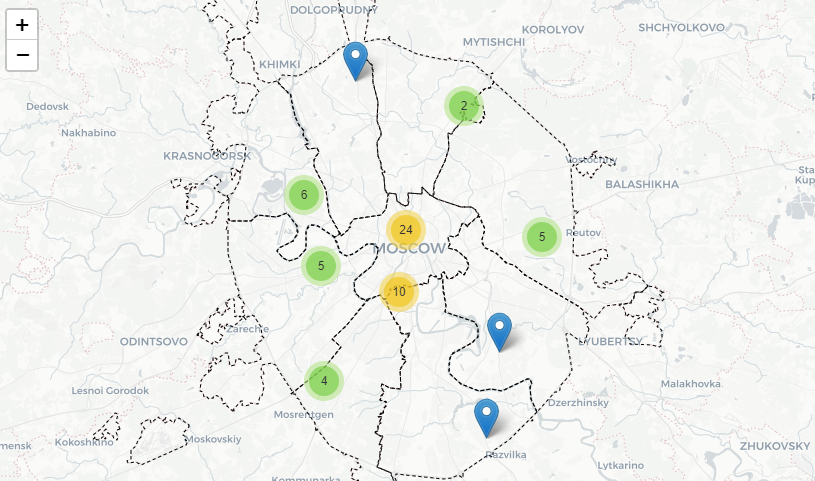

In [68]:
local_image_path_9 = r'C:\Users\grigl\Desktop\A. Lapidus\Яндекс Практикум\Редактура проектов\Project 9\4.3. 24_7 Coffee Shops.png'
Image(filename=local_image_path_9)

There are very few 24/7 and daily-operating coffee shops. Most of them are concentrated in the Central District.

### Distribution of Coffee Shop Ratings by Districts

We will determine the ratings of coffee shops and how they are distributed across districts, then visualize this information.

In [69]:
# For each district, calculating the average rating of coffee shops located within it:
coffee_rating_by_district = coffee_shop.groupby('district', as_index=False)['rating'].agg('mean')
coffee_rating_by_district = coffee_rating_by_district.sort_values(by = 'rating')
coffee_rating_by_district.reset_index(drop = True)

,district,rating
0,Western Administrative Okrug,4.195333
1,North-Eastern Administrative Okrug,4.216981
2,South-Eastern Administrative Okrug,4.225843
3,Southern Administrative Okrug,4.232824
4,Eastern Administrative Okrug,4.282857
5,South-Western Administrative Okrug,4.283333
6,Northern Administrative Okrug,4.291710
7,North-Western Administrative Okrug,4.325806
8,Central Administrative Okrug,4.336449


In [70]:
# moscow_lat - latitude of the center of Moscow, moscow_lng - longitude of the center of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423

# Creating a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Creating a Choropleth map using the Choropleth constructor and adding it to the map
Choropleth(
    geo_data=state_geo,
    data=coffee_rating_by_district,
    columns=['district', 'rating'],
    key_on='properties.name:en',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Average Coffee Shop Rating by District',
    opacity=0.5  
).add_to(m)

# Adding district names as tooltips
tooltip = GeoJsonTooltip(
    fields=['name:en'],  
    aliases=['District'],  
    localize=True,  
    sticky=False,  
    labels=True,  
    style="color: black; background-color: rgba(255, 255, 255, 0.8);"  
)

geojson_layer = GeoJson(
    state_geo,
    tooltip=tooltip,
    style_function=lambda feature: {
        'fillColor': 'black',  
        'color': 'black',  
        'weight': 1, 
        'dashArray': '3',  
        'fillOpacity': 0,  
    }
).add_to(m)

# Displaying the map
#m

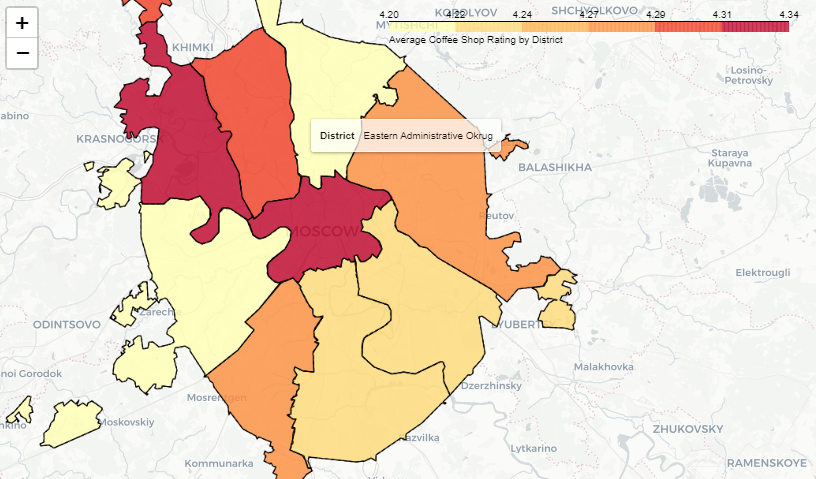

In [71]:
local_image_path_10 = r'C:\Users\grigl\Desktop\A. Lapidus\Яндекс Практикум\Редактура проектов\Project 9\4.4. Distribution of Coffee Shop Ratings.png'
Image(filename=local_image_path_10)

According to the chart, the best establishments, according to their visitors, are located in the Central and North-Western Districts. 

Regarding the distribution of cappuccino prices, the visualization of the obtained data is presented above. Depending on the marketing strategy, one can target an average price of 166 rubles to attract the maximum number of customers, or a range of 176-187 rubles to maintain a competitive advantage while not sacrificing profitability.

In summary, based on the analysis of coffee shops in Moscow, the most promising areas for opening a new coffee shop are the Western and South-Western Administrative Districts. The Central District is heavily saturated with establishments in this category, while the number of coffee shops in the two aforementioned districts can be characterized as average and low, respectively. Both districts have the highest prices for a cup of cappuccino, meaning that slightly lowering the price could provide a significant competitive advantage. Additionally, both districts have few establishments with the highest ratings, which again creates opportunities for successful competition. Finally, since there are only a few 24/7 coffee shops in the Western and South-Western Districts, there is a potential market niche to be filled.

## Analysis Results

Summary of the Data Analysis:

- The leaders in terms of the number of establishments in Moscow are cafés and restaurants, with the fewest being canteens and bakeries.
- Bars/pubs and restaurants have the highest average number of seats, while cafés have the lowest.
- The average rating of establishments is nearly independent of their category.
- Non-chain establishments outnumber chain establishments by approximately one-third.
- Chain establishments are more frequently represented by bakeries, pizzerias, and cafés, while non-chain ones are found in other categories.
- The most popular chains in Moscow are large nationwide networks (the top three are "Shokoladnitsa," "Domino's Pizza," and "Dodo Pizza").
- The Central District leads by a significant margin in terms of the number of establishments across all categories.
- The Central District also leads in average rating, number of establishments, average check, and median prices for coffee and beer.
- The largest number of establishments is located on the largest streets; four out of the top five positions are occupied by avenues: Mira, Vernadskogo, Leninsky, and Leningradsky.
- The fewest establishments are located in the center, in alleys and small streets, or on the periphery.

The most promising districts for opening a new café are the Western and South-Western Administrative Districts. These districts have a medium or low number of such establishments, the highest prices for a cup of cappuccino, and a slight reduction in price could provide a significant competitive advantage. Additionally, both districts have few high-rated establishments.